In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Model Training

In the original paper, they used k-folds during testing since the data is very minimal.
- The custom data set will have 2 modes: **train** and **test**. We'll apply k-folds to the train mode, to generate the train and validation sets. And the test mode, to generate the test set. This test set will never be used during training.

torch.Size([3, 300, 300])


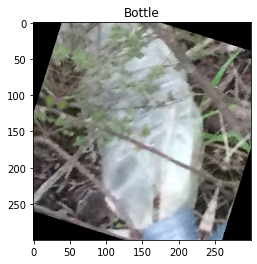

In [ ]:
from torch.utils.data import Dataset
import json
import cv2 as cv
from math import floor, ceil
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import torchvision.transforms as T
from PIL import Image

# Custom Dataset Class
class TacoDataset(Dataset):
    def __init__(self, mode="train", transforms=T.Compose([])):
        # Path Variables
        dataset = "TACO-3"
        dir_path = '/content/drive/MyDrive/data/TACO/'

        # Read dataset file
        dataset_path = dir_path + "train_" + dataset + ".csv" if mode == "train" else dir_path + "test_" + dataset + ".csv"
        with open(dataset_path, 'r') as f:
            self.data = pd.read_csv(f)

        # Category Id to to Category Name Mapping
        self.cat_id2name = self.data[['supercat_id', 'supercategory']].drop_duplicates()

        # Image Transforms
        self.transforms = transforms

    def __getitem__ (self, idx):
        # read image file
        imgs_filepath = '/content/drive/MyDrive/data/TACO/'
        img = Image.open(imgs_filepath + self.data.iloc[idx]['file_name'])

        # crop image based on bounding box
        bbox = self.data.iloc[idx]['bbox'][1:-1]
        bbox = bbox.split(',')
        left, top, right, bottom = float(bbox[0]), float(bbox[1]), float(bbox[0])+float(bbox[2]), float(bbox[1])+float(bbox[3])
        img1 = img.crop((left,top,right,bottom))
        # print(f"img.size: {img.size} | img1.size: {img1.size}")

        # resize image
        img1 = T.functional.resize(img1, size=299, max_size=300)
        w,h = img1.size
        h_padding = (300 - w) / 2
        v_padding = (300 - h) / 2
        lp = h_padding if h_padding % 1 == 0 else h_padding+0.5
        tp = v_padding if v_padding % 1 == 0 else v_padding+0.5
        rp = h_padding if h_padding % 1 == 0 else h_padding-0.5
        bp = v_padding if v_padding % 1 == 0 else v_padding-0.5

        img1 = T.functional.pad(img1, padding=(int(lp), int(tp), int(rp), int(bp)), padding_mode='reflect')

        # apply transformations
        img2 = self.transforms(img1)

        # get classificaation
        cat_id = self.data.iloc[idx]['supercat_id']

        return img2, cat_id

    def __len__(self):
        return len(self.data)

transforms = T.Compose([T.RandomVerticalFlip(0.75)
                       ,T.RandomHorizontalFlip(0.75)
                       ,T.RandomRotation(45)
                       ,T.ToTensor()
                       ])
temp_dataset = TacoDataset(mode="train", transforms=transforms)

# print(temp_dataset.dataset_df)
# print(temp_dataset.cat_id2name)

img, label = temp_dataset[0]
print(img.shape)
plt.imshow(img.permute(1,2,0))
plt.title(temp_dataset.cat_id2name[temp_dataset.cat_id2name['supercat_id'] == label]['supercategory'].values[0])
plt.show()

## Datasets

In [ ]:
from torch.utils.data import DataLoader, ConcatDataset
import torchvision.transforms as T

# Transforms
aug1 = T.Compose([T.RandomVerticalFlip(1)
                  ,T.ToTensor()])
aug2 = T.Compose([T.RandomHorizontalFlip(1)
                  ,T.ToTensor()])
aug3 = T.Compose([T.RandomRotation(45)
                  ,T.ToTensor()])
aug4 = T.Compose([T.RandomRotation(90)
                 ,T.ToTensor()])
aug5 = T.Compose([T.RandomRotation(135)
                 ,T.ToTensor()])
test_transforms = T.Compose([T.ToTensor()])

# Datasets
orig_dataset = TacoDataset(mode="train", transforms=test_transforms)
add_dataset1 = TacoDataset(mode="train", transforms=aug1)
add_dataset2 = TacoDataset(mode="train", transforms=aug2)
add_dataset3 = TacoDataset(mode="train", transforms=aug3)
add_dataset4 = TacoDataset(mode="train", transforms=aug4)
add_dataset5 = TacoDataset(mode="train", transforms=aug5)
train_dataset = ConcatDataset([orig_dataset, add_dataset1, add_dataset2, add_dataset3, add_dataset4, add_dataset5])
test_dataset = TacoDataset(mode="test", transforms=test_transforms)
print(f"Number of training data: {len(train_dataset)}")
print(f"Number of test data: {len(test_dataset)}")

Number of training data: 4068
Number of test data: 226


### View data in one mini batch

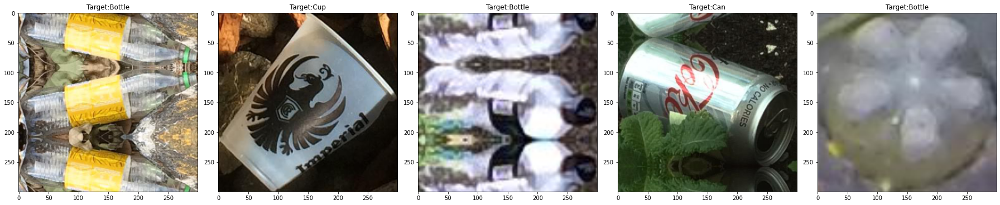

In [ ]:
import torchvision

temp_dataloader = DataLoader(orig_dataset, batch_size=5, shuffle=True)
fig, axes = plt.subplots(1,5, figsize=(25,25))
for i, minibatch in enumerate(temp_dataloader):
    imgs, targets = minibatch[0], minibatch[1]
    if(i==2):
        for j in range(len(minibatch[0])):
            img, target = imgs[j].cpu(), targets[j].item()
            target_name = test_dataset.cat_id2name[test_dataset.cat_id2name['supercat_id'] == target].supercategory.item()
            axes[j].imshow(img.permute(1,2,0))
            axes[j].set_title(f"Target:{target_name}")
        break

plt.tight_layout()
plt.show()

### View all the cropped images

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  # This is added back by InteractiveShellApp.init_path()


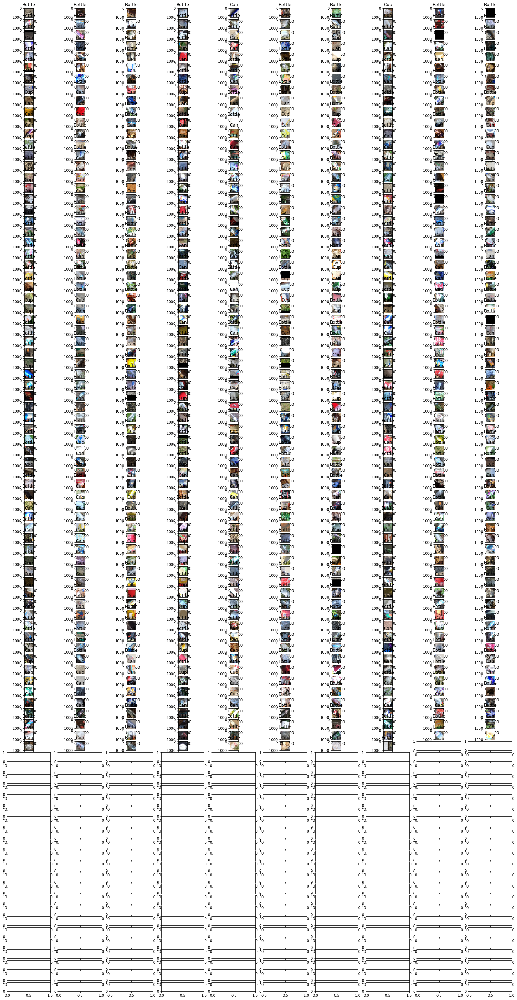

In [ ]:
import torchvision

temp_dataloader = DataLoader(train_dataset, batch_size=10, shuffle=True)

fig, axes = plt.subplots(70,10, figsize=(100,50))
for i, mini_batch in enumerate(temp_dataloader):
    for j in range(len(mini_batch[0])):
        img, label = mini_batch[0][j], mini_batch[1][j].item()
        axes[i][j].imshow(img.permute(1,2,0))
        axes[i][j].set_title(train_dataset.cat_id2name[train_dataset.cat_id2name['supercat_id'] == label].supercategory.item())
plt.tight_layout()
plt.show()

## Display one image per label

In [ ]:
temp_dataset.cat_id2name

,supercat_id,supercategory
0,3,Bottle
329,6,Can
534,8,Cup


[3 6 8]
looking image with label: 3
looking image with label: 6
looking image with label: 8
Images: [<PIL.Image.Image image mode=RGB size=272x328 at 0x7F515BB1D5D0>, <PIL.Image.Image image mode=RGB size=93x88 at 0x7F5159E5BF50>, <PIL.Image.Image image mode=RGB size=235x234 at 0x7F5159E554D0>]
Labels: [3, 6, 8]


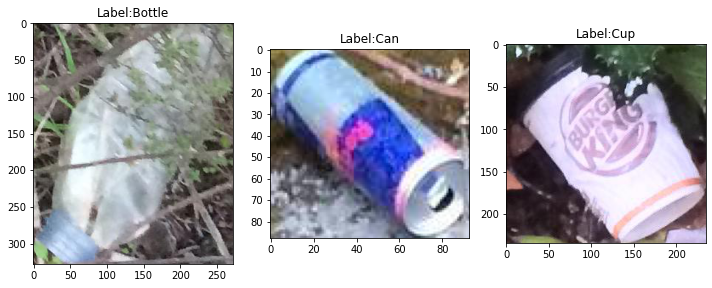

In [ ]:
# display one image per label

temp_dataset = TacoDataset()
imgs = []
labels = []

# get an image for each super category
supercats = temp_dataset.data.supercat_id.drop_duplicates().values
print(supercats)
for category in supercats:
    print(f"looking image with label: {category}")
    for i in range(len(temp_dataset)):
        img, cat_id = temp_dataset[i]
        if cat_id == category:
            imgs.append(img)
            labels.append(cat_id)
            break

print("Images:", imgs)
print("Labels:", labels)

fig, axes = plt.subplots(1,len(supercats), figsize=(10,10))
for i, (img, label) in enumerate(zip(imgs, labels)):
    axes[i].imshow(img)
    axes[i].set_title(f"Label:{temp_dataset.cat_id2name[temp_dataset.cat_id2name.supercat_id == label].supercategory.values[0]}")
plt.tight_layout()
plt.show()

Split the Dataset

The original paper proposed a TACO-10 dataset, which contains the top 9 classes and an extra class 'Other'

## Model

In [ ]:
import torchvision.models as models
import torch.nn as nn
import torch.cuda as cuda

model = models.efficientnet_v2_m(weights="EfficientNet_V2_M_Weights.DEFAULT") # model with pre-trained weights
in_features = model.classifier[1].in_features

num_categories = 3
model.classifier[1] = nn.Linear(in_features, num_categories)
print(f"# of categories: {num_categories}")

for child in model.children():
  for param in child.parameters():
    param.required_grad = False

model.classifier[1].requires_grad = True

device = 'cuda' if cuda.is_available() else 'cpu'
model = model.to(device)
print(f"device:{device}")

Downloading: "https://download.pytorch.org/models/efficientnet_v2_m-dc08266a.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_v2_m-dc08266a.pth


  0%|          | 0.00/208M [00:00<?, ?B/s]

# of categories: 3
device:cuda


## Training

## Simple Train - Validation Split

In [ ]:
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

import numpy as np
import torch
from torch.utils.data import DataLoader, SubsetRandomSampler
from sklearn.model_selection import KFold
from math import ceil
import torch.nn as nn

EPOCHS = 5
BATCHSIZE = 8
LEARNING_RATE = 0.001

criterion = nn.CrossEntropyLoss(reduction = 'mean') # cross entropy loss function for classification
optimizer = torch.optim.SGD(model.parameters(), lr=LEARNING_RATE) # stochastic gradient descent with learning rate of 0.0001

# initialize training losses
train_losses = []

train_dataloader = DataLoader(train_dataset, BATCHSIZE, shuffle=True)
valid_dataloader = DataLoader(test_dataset, BATCHSIZE)

num_batches = len(train_dataloader)
num_data = len(train_dataset)
print(f"# of batches: {num_batches}")
print(f"# of data: {num_data}")

for e in range(EPOCHS):
    # set model to train mode
    model.train()

    for b,(X,y) in enumerate(train_dataloader):
        # send the data to device(gpu)
        X, y = X.to(device), y.to(device)

        # generate predictions and compute the loss
        y_pred = model(X)
        train_loss = criterion(y_pred,y)

        # update the weights
        optimizer.zero_grad()
        train_loss.backward()
        optimizer.step()

        # save loss
        train_losses.append(train_loss.item())

        if b%10 == 0:
            print(f"Epoch {e+1:2} | Batch {b+1:3} | Loss = {train_loss.item():0.4f}")

# of batches: 509
# of data: 4068
Epoch  1 | Batch   1 | Loss = 0.4855
Epoch  1 | Batch  11 | Loss = 0.2202
Epoch  1 | Batch  21 | Loss = 0.6220
Epoch  1 | Batch  31 | Loss = 0.2857
Epoch  1 | Batch  41 | Loss = 0.1990
Epoch  1 | Batch  51 | Loss = 0.1625
Epoch  1 | Batch  61 | Loss = 0.0731
Epoch  1 | Batch  71 | Loss = 0.7695
Epoch  1 | Batch  81 | Loss = 0.2289
Epoch  1 | Batch  91 | Loss = 0.1759
Epoch  1 | Batch 101 | Loss = 0.1239
Epoch  1 | Batch 111 | Loss = 0.3048
Epoch  1 | Batch 121 | Loss = 0.2166
Epoch  1 | Batch 131 | Loss = 0.2805
Epoch  1 | Batch 141 | Loss = 0.2513
Epoch  1 | Batch 151 | Loss = 0.7016
Epoch  1 | Batch 161 | Loss = 0.1527
Epoch  1 | Batch 171 | Loss = 0.1184
Epoch  1 | Batch 181 | Loss = 0.4573
Epoch  1 | Batch 191 | Loss = 0.1628
Epoch  1 | Batch 201 | Loss = 0.0916
Epoch  1 | Batch 211 | Loss = 0.3588
Epoch  1 | Batch 221 | Loss = 0.3447
Epoch  1 | Batch 231 | Loss = 0.4084
Epoch  1 | Batch 241 | Loss = 0.2260
Epoch  1 | Batch 251 | Loss = 0.3764
Epoc

## K-Folds

In [ ]:
import numpy as np
import torch
from torch.utils.data import DataLoader, SubsetRandomSampler
from sklearn.model_selection import KFold
from math import ceil

EPOCHS = 1
BATCHSIZE = 16
LEARNING_RATE = 0.001

NUM_FOLDS = 4
folds = KFold(n_splits=NUM_FOLDS, shuffle=True, random_state=1)

criterion = nn.CrossEntropyLoss(reduction='mean') # cross entropy loss function for classification
optimizer = torch.optim.SGD(model.parameters(), lr=LEARNING_RATE) # stochastic gradient descent with learning rate of 0.0001

# set model to train mode
model.train()

train_losses = []
validation_losses = []
for fold, (train, valid) in enumerate(folds.split(np.arange(len(train_dataset)))):
    # create data loaders
    train_sampler = SubsetRandomSampler(train) # this just shuffles the indices
    valid_sampler = SubsetRandomSampler(valid)

    train_dataloader = DataLoader(train_dataset, BATCHSIZE, sampler=train_sampler)
    valid_dataloader = DataLoader(train_dataset, BATCHSIZE, sampler=valid_sampler)

    num_batches = ceil(len(train) / BATCHSIZE)
    print(f"=== Fold {fold} | # of batches: {num_batches}")

    for e in range(EPOCHS):
        for b,(X,y) in enumerate(train_dataloader):
            # send the data to device(gpu)
            X, y = X.to(device), y.to(device)

            # generate predictions and compute the loss
            y_pred = model(X)
            train_loss = criterion(y_pred,y)

            # update the weights
            optimizer.zero_grad()
            train_loss.backward()
            optimizer.step()

            # save loss
            train_losses.append(train_loss.item())
            if b%100 == 0:
                print(f"Fold {fold+1:2} | Epoch {e+1:2} | Batch {b+1:3} | Loss = {train_loss.item():0.4f}")


    # compute validation loss
    model.eval()
    valid_loss = 0.0
    for b,(X,y) in enumerate(valid_dataloader):
        with torch.no_grad():
            print(f"batch {b+1}/{num_batches}")
            # send the data to device(gpu)
            X, y = X.to(device), y.to(device)

            # generate predictions and compute the loss
            y_pred = model(X)
            valid_loss += criterion(y_pred,y).item()
            validation_losses.append(valid_loss)


Fold  1 | Epoch  1 | Batch   1 | Loss = 1.1253


KeyboardInterrupt: ignored

# Plot Training Loss

In [ ]:
plt.plot(train_losses)
plt.title('Trained with data augmentation')
plt.show()

NameError: ignored

### Save loss

In [ ]:
import csv

with open("/content/drive/MyDrive/data/TACO/efficientNet_data-aug-v2_loss.csv", 'w') as f:

    # using csv.writer method from CSV package
    write = csv.writer(f)
    for loss in train_losses:
        write.writerow([loss])

### Load Loss

In [ ]:
import csv

with open('/content/drive/MyDrive/data/TACO/efficientNet_data-aug-v2_loss.csv', newline='') as f:
    reader = csv.reader(f)
    temp_losses = []
    for row in reader:
        temp_losses.append(float(row[0]))
    print(len(temp_losses))

temp_losses = temp_losses + train_losses
print(len(temp_losses))

2545
7635


# Save Model

In [ ]:
# save model
torch.save(model, "/content/drive/MyDrive/data/TACO/models/efficientNet_data-aug-v2.pt")

# Validate Model

## Load Model

In [ ]:
%pip install torchinfo
import torch
from torchinfo import summary
import torch.cuda as cuda

if cuda.is_available():
    model = torch.load("/content/drive/MyDrive/data/TACO/models/efficientNet_data-aug-v2.pt")
else:
    model = torch.load("/content/drive/MyDrive/data/TACO/models/efficientNet_data-aug-v2.pt", map_location=torch.device('cpu'))

device = 'cuda' if cuda.is_available() else 'cpu'
model = model.to(device)
print(f"device: {device}")
summary(model, (8,3,1024,1024))

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
device: cpu


Layer (type:depth-idx)                                  Output Shape              Param #
EfficientNet                                            [8, 3]                    --
├─Sequential: 1-1                                       [8, 1280, 32, 32]         --
│    └─Conv2dNormActivation: 2-1                        [8, 24, 512, 512]         --
│    │    └─Conv2d: 3-1                                 [8, 24, 512, 512]         648
│    │    └─BatchNorm2d: 3-2                            [8, 24, 512, 512]         48
│    │    └─SiLU: 3-3                                   [8, 24, 512, 512]         --
│    └─Sequential: 2-2                                  [8, 24, 512, 512]         --
│    │    └─FusedMBConv: 3-4                            [8, 24, 512, 512]         5,232
│    │    └─FusedMBConv: 3-5                            [8, 24, 512, 512]         5,232
│    │    └─FusedMBConv: 3-6                            [8, 24, 512, 512]         5,232
│    └─Sequential: 2-3                            

## Validate Model

### Training Set

In [ ]:
import torch
from torch.utils.data import DataLoader
import torchvision.transforms as T
import torch.nn as nn
from math import ceil

BATCHSIZE = 8

transforms = T.Compose([T.ToTensor()])
dataset = TacoDataset(mode="train", transforms=transforms)
dataloader = DataLoader(dataset, BATCHSIZE)

NUM_BATCHES = ceil(len(dataset) / BATCHSIZE)
NUM_DATA = len(dataset)
print(f"# of batches: {NUM_BATCHES}")
print(f"# of data: {NUM_DATA}")

criterion = nn.CrossEntropyLoss(reduction='mean') # cross entropy loss function for classification
loss = 0
correct = 0
targets = []
outputs = []
mislabeled_datas = []

model.eval()
for b,(X,y) in enumerate(dataloader):
    with torch.no_grad():
        print(f"batch {b+1}/{NUM_BATCHES}")
        # send the data to device(gpu)
        X, y = X.to(device), y.to(device)

        # generate predictions and compute the loss
        y_pred = model(X)
        loss += criterion(y_pred,y).item()
        correct += (y_pred.argmax(1) == y).type(torch.float).sum().item()

        # save y and y_pred (to be used in confusion matrix)
        outputs += y_pred.argmax(1).tolist()
        targets += y.tolist()

        # save y and y_pred (to be used in confusion matrix)
        outputs += y_pred.argmax(1).tolist()
        targets += y.tolist()

        # save index of mislabeled data
        mask = (y_pred.argmax(1) != y)
        mislabeled_data = X[mask,:]
        correct_label = y[mask]
        pred_label = y_pred.argmax(1)[mask]
        mislabeled_datas.append((mislabeled_data, correct_label, pred_label))

ave_loss = loss / NUM_BATCHES
accuracy = correct / NUM_DATA
print(f"Training Set loss = {ave_loss:0.4f}")
print(f"Training Set accuracy = {accuracy:0.4f}")

# of batches: 85
# of data: 678
batch 1/85
batch 2/85
batch 3/85
batch 4/85
batch 5/85
batch 6/85
batch 7/85
batch 8/85
batch 9/85
batch 10/85
batch 11/85
batch 12/85
batch 13/85
batch 14/85
batch 15/85
batch 16/85
batch 17/85
batch 18/85
batch 19/85
batch 20/85
batch 21/85
batch 22/85
batch 23/85
batch 24/85
batch 25/85
batch 26/85
batch 27/85
batch 28/85
batch 29/85
batch 30/85
batch 31/85
batch 32/85
batch 33/85
batch 34/85
batch 35/85
batch 36/85
batch 37/85
batch 38/85
batch 39/85
batch 40/85
batch 41/85
batch 42/85
batch 43/85
batch 44/85
batch 45/85
batch 46/85
batch 47/85
batch 48/85
batch 49/85
batch 50/85
batch 51/85
batch 52/85
batch 53/85
batch 54/85
batch 55/85
batch 56/85
batch 57/85
batch 58/85
batch 59/85
batch 60/85
batch 61/85
batch 62/85
batch 63/85
batch 64/85
batch 65/85
batch 66/85
batch 67/85
batch 68/85
batch 69/85
batch 70/85
batch 71/85
batch 72/85
batch 73/85
batch 74/85
batch 75/85
batch 76/85
batch 77/85
batch 78/85
batch 79/85
batch 80/85
batch 81/85
batch

### Training Set Confusion Matrix

In [ ]:
num_mislabeled = 0
for i in mislabeled_datas:
    num_mislabeled += len(i[1])
    print(f"# of mislabeled data in batch = {len(i[1])}")
print(f"Total number of mislabeled data = {num_mislabeled}")

# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabele

In [ ]:
from sklearn import metrics

print(metrics.classification_report(targets, outputs))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99       658
           1       1.00      0.99      0.99       410
           2       1.00      0.97      0.99       288

    accuracy                           0.99      1356
   macro avg       0.99      0.99      0.99      1356
weighted avg       0.99      0.99      0.99      1356



In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sn
import pandas as pd

# constant for classes
classes = ('Bottle', 'Can', 'Cup')

# Build confusion matrix
cf_matrix = confusion_matrix(targets, outputs)
df_cm = pd.DataFrame(cf_matrix/np.sum(cf_matrix) *100, index = [i for i in classes], columns = [i for i in classes])
plt.figure(figsize = (12,7))
sn.heatmap(df_cm, annot=True)
plt.savefig('output.png')

### Test Set

In [ ]:
from torch.utils.data import DataLoader
import torchvision.transforms as T
import torch.nn as nn
from math import ceil

BATCHSIZE = 16

transforms = T.Compose([T.ToTensor()])
dataset = TacoDataset(mode="test", transforms=transforms)
dataloader = DataLoader(dataset, BATCHSIZE)

NUM_BATCHES = ceil(len(dataset) / BATCHSIZE)
NUM_DATA = len(dataset)
print(f"# of batches: {NUM_BATCHES}")
print(f"# of data: {NUM_DATA}")

criterion = nn.CrossEntropyLoss(reduction = "mean") # cross entropy loss function for classification
loss = 0
correct = 0
test_targets = []
test_outputs = []
mislabeled_datas = []

model.eval()
for b,(X,y) in enumerate(dataloader):
    with torch.no_grad():
        print(f"batch {b+1}/{NUM_BATCHES}")
        # send the data to device(gpu)
        X, y = X.to(device), y.to(device)

        # generate predictions and compute the loss
        y_pred = model(X)
        loss += criterion(y_pred,y).item()
        correct += (y_pred.argmax(1) == y).type(torch.float).sum().item()

        # save y and y_pred (to be used in confusion matrix)
        test_outputs += y_pred.argmax(1).tolist()
        test_targets += y.tolist()

        # save index of mislabeled data
        mask = (y_pred.argmax(1) != y)
        mislabeled_data = X[mask,:]
        correct_label = y[mask]
        pred_label = y_pred.argmax(1)[mask]
        mislabeled_datas.append((mislabeled_data, correct_label, pred_label))

ave_loss = loss / NUM_BATCHES
accuracy = correct / NUM_DATA
print(f"Test Set loss = {ave_loss:0.4f}")
print(f"Test Set accuracy = {accuracy:0.4f}")

# of batches: 15
# of data: 226
batch 1/15
batch 2/15
batch 3/15
batch 4/15
batch 5/15
batch 6/15
batch 7/15
batch 8/15
batch 9/15
batch 10/15
batch 11/15
batch 12/15
batch 13/15
batch 14/15
batch 15/15
Test Set loss = 0.3632
Test Set accuracy = 0.8717


In [ ]:
num_mislabeled = 0
for i in mislabeled_datas:
    num_mislabeled += len(i[1])
    print(f"# of mislabeled data in batch = {len(i[1])}")
print(f"Total number of mislabeled data = {num_mislabeled}")

# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 0
# of mislabeled data in batch = 2
# of mislabeled data in batch = 0
# of mislabeled data in batch = 7
# of mislabeled data in batch = 2
# of mislabeled data in batch = 2
# of mislabeled data in batch = 7
# of mislabeled data in batch = 6
# of mislabeled data in batch = 3
# of mislabeled data in batch = 0
Total number of mislabeled data = 29


#### function version

In [ ]:
def get_validation_loss(model):
    BATCHSIZE = 16

    transforms = T.Compose([T.ToTensor()])
    dataset = TacoDataset(mode="test", transforms=transforms)
    dataloader = DataLoader(dataset, BATCHSIZE)

    NUM_BATCHES = ceil(len(dataset) / BATCHSIZE)
    NUM_DATA = len(dataset)

    criterion = nn.CrossEntropyLoss(reduction = "mean") # cross entropy loss function for classification
    loss = 0

    model.eval()
    for b,(X,y) in enumerate(dataloader):
        with torch.no_grad():
            # send the data to device(gpu)
            X, y = X.to(device), y.to(device)

            # generate predictions and compute the loss
            y_pred = model(X)
            loss += criterion(y_pred,y).item()
    ave_loss = loss / NUM_BATCHES
    return ave_loss

temp_loss = get_validation_loss(model)
print(temp_loss)

0.3632239006149272


### Display Mislabeled Data

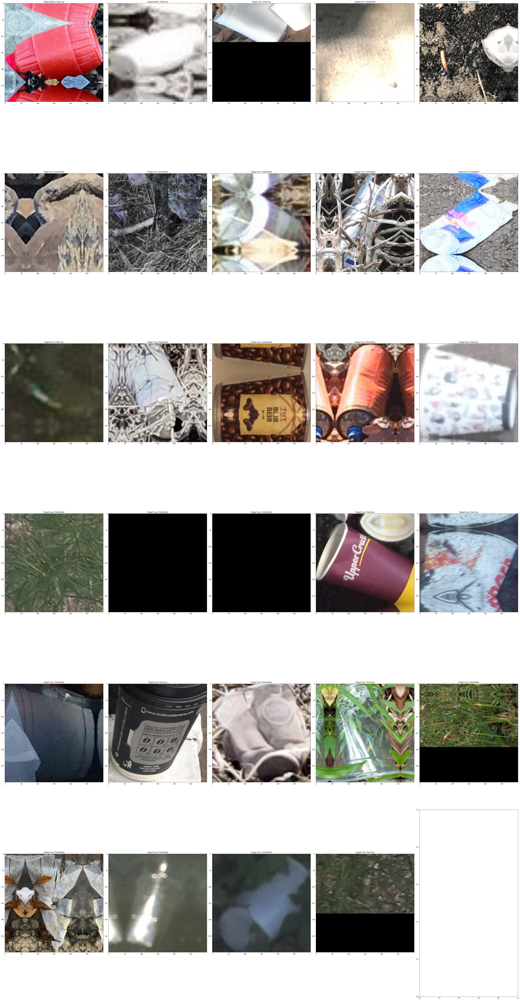

In [ ]:
fig, axes = plt.subplots(6,5, figsize=(50,100))
row = 0
col = 0
for i, (imgs, targets, preds) in enumerate(mislabeled_datas):
    for j in range(len(targets)):
        img, target, pred = imgs[j].cpu(), targets[j].item(), preds[j].item()
        target_name = test_dataset.cat_id2name[test_dataset.cat_id2name['supercat_id'] == target].supercategory.item()
        pred_name = test_dataset.cat_id2name[test_dataset.cat_id2name['supercat_id'] == pred].supercategory.item()
        axes[row][col].imshow(img.permute(1,2,0))
        axes[row][col].set_title(f"Target:{target_name} | Pred:{pred_name}")

        col += 1
        if col == 5:
            row += 1
            col = 0

plt.tight_layout()
plt.show()

## Test Set Confusion Matrix

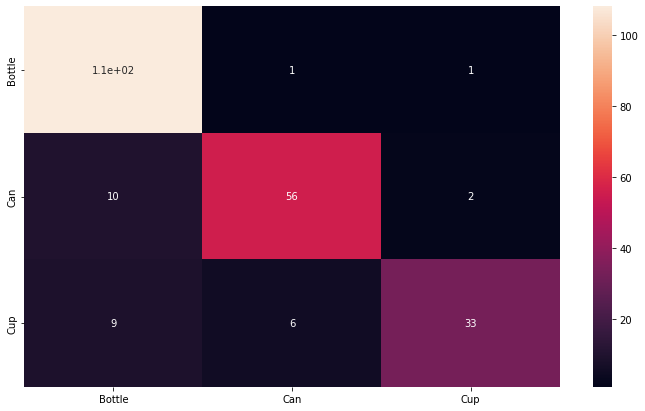

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sn
import pandas as pd

# constant for classes
classes = ('Bottle', 'Can', 'Cup')

# Build confusion matrix
test_cf_matrix = confusion_matrix(test_targets, test_outputs)
df_cm_test = pd.DataFrame(test_cf_matrix, index = [i for i in classes], columns = [i for i in classes])
# df_cm_test = pd.DataFrame(test_cf_matrix/np.sum(test_cf_matrix) *100, index = [i for i in classes], columns = [i for i in classes])
plt.figure(figsize = (12,7))
sn.heatmap(df_cm_test, annot=True)
plt.savefig('output.png')

In [ ]:
from sklearn import metrics

print(metrics.classification_report(test_targets, test_outputs))

              precision    recall  f1-score   support

           0       0.85      0.98      0.91       110
           1       0.89      0.82      0.85        68
           2       0.92      0.69      0.79        48

    accuracy                           0.87       226
   macro avg       0.89      0.83      0.85       226
weighted avg       0.88      0.87      0.87       226

